In [2]:
import os
import cv2
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from sklearn.model_selection import train_test_split
from PIL import Image

# Define image path
IMAGE_PATH = '/kaggle/input/enhanced-sharp'


# Custom Dataset Class
class KatherDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.images = []
        self.labels = []
        self.load_images()

    def load_images(self):
        categories = ['01_TUMOR', '02_STROMA', '03_COMPLEX', '04_LYMPHO', '05_DEBRIS', '06_MUCOSA', '07_ADIPOSE', '08_EMPTY']
        for label, category in enumerate(categories):
            category_path = os.path.join(self.image_dir, category)
            for image_name in os.listdir(category_path):
                image_path = os.path.join(category_path, image_name)
                self.images.append(image_path)
                self.labels.append(label)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        label = self.labels[idx]
        image = Image.open(image_path)
        if self.transform:
            image = self.transform(image)
        return image, label

In [2]:
# Custom transform to apply CLAHE
import cv2
import numpy as np

class CLAHETransform:
    def __init__(self, clip_limit=0.7, tile_grid_size=(4, 4)):
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size

    def __call__(self, img):
        img = np.array(img)
        if len(img.shape) == 2:  # Grayscale image
            clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
            img = clahe.apply(img)
        else:  # Color image
            lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
            l, a, b = cv2.split(lab)
            clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
            cl = clahe.apply(l)
            limg = cv2.merge((cl, a, b))
            img = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
        return Image.fromarray(img)

In [3]:
# RESNET, DENSENET121
transform = transforms.Compose([
#     CLAHETransform(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [9]:
# INCEPTION, GOOGLENET
transform = transforms.Compose([
    transforms.Resize((299, 299)),  # Resize images to 299x299
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [4]:
# Create dataset and dataloaders
dataset = KatherDataset(IMAGE_PATH, transform=transform)
train_idx, val_idx = train_test_split(list(range(len(dataset))), test_size=0.15, stratify=dataset.labels)
train_dataset = torch.utils.data.Subset(dataset, train_idx)
val_dataset = torch.utils.data.Subset(dataset, val_idx)

In [5]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

In [6]:
class SelfAttention(nn.Module):
    def __init__(self, embed_size, heads):
        super(SelfAttention, self).__init__()
        self.embed_size = embed_size
        self.heads = heads
        self.head_dim = embed_size // heads

        assert (
            self.head_dim * heads == embed_size
        ), "Embedding size needs to be divisible by heads"

        self.values = nn.Linear(self.head_dim, self.head_dim, bias=False)
        self.keys = nn.Linear(self.head_dim, self.head_dim, bias=False)
        self.queries = nn.Linear(self.head_dim, self.head_dim, bias=False)
        self.fc_out = nn.Linear(heads * self.head_dim, embed_size)

    def forward(self, values, keys, query, mask=None):
        N = query.shape[0]
        value_len, key_len, query_len = values.shape[1], keys.shape[1], query.shape[1]

        # split embed self.heads diff pieces
        values = values.reshape(N, value_len, self.heads, self.head_dim)
        keys = keys.reshape(N, key_len, self.heads, self.head_dim)
        queries = query.reshape(N, query_len, self.heads, self.head_dim)

        values = self.values(values)
        keys = self.keys(keys)
        queries = self.queries(queries)
        
        # einstein sum --> computes the attention scores between q and k for each head across the batch.
        energy = torch.einsum("nqhd,nkhd->nhqk", [queries, keys])

        if mask is not None:
            energy = energy.masked_fill(mask == 0, float("-1e20"))

        # attention weights u/ each head & each query-key pair
        attention = torch.nn.functional.softmax(energy / (self.embed_size ** (1 / 2)), dim=3)

        out = torch.einsum("nhql,nlhd->nqhd", [attention, values]).reshape(
            N, query_len, self.heads * self.head_dim
        )

        out = self.fc_out(out)
        return out

In [7]:
# RESNET50

class HybridModel(nn.Module):
    def __init__(self, num_classes, embed_size, heads):
        super(HybridModel, self).__init__()
        self.cnn = models.resnet50()
        self.cnn.load_state_dict(torch.load('/kaggle/input/resnet50/pytorch/resnet/1/resnet50-0676ba61.pth'))
        
        # last conv layer
        self.cnn = nn.Sequential(*(list(self.cnn.children())[:-2]))  # Remove gap & fully connected layers
        
        self.conv1x1 = nn.Conv2d(2048, embed_size, kernel_size=1, stride=1)
        self.relu = nn.ReLU()

        self.self_attention = SelfAttention(embed_size, heads)

        self.classifier = nn.Sequential(
            nn.Linear(embed_size, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.cnn(x)
        features = self.conv1x1(features)
        features = self.relu(features)
        
        # unpack
        N, C, H, W = features.shape
        features = features.view(N, C, -1).permute(0, 2, 1)  # Reshape to (N, H*W, C)

        attn_output = self.self_attention(features, features, features)
        attn_output = attn_output.permute(0, 2, 1).view(N, C, H, W)  # Reshape back to (N, C, H, W)

        pooled_features = torch.nn.functional.adaptive_avg_pool2d(attn_output, (1, 1)).view(features.size(0), -1)  # Global pooling and flatten
        out = self.classifier(pooled_features)
        return out, features

In [6]:
# INCEPTIONV3
class HybridModel(nn.Module):
    def __init__(self, num_classes, embed_size, heads):
        super(HybridModel, self).__init__()
        self.cnn = models.inception_v3(pretrained=False, aux_logits=True)
        self.cnn.load_state_dict(torch.load('/kaggle/input/inceptionv3/pytorch/inceptionv3/1/inception_v3_google-1a9a5a14.pth'))

        # Modify Inception v3 to output features before the fully connected layers
        self.cnn.Mixed_7c.register_forward_hook(self._hook)

        self.conv1x1 = nn.Conv2d(2048, embed_size, kernel_size=1, stride=1)
        self.relu = nn.ReLU()

        self.self_attention = SelfAttention(embed_size, heads)

        self.classifier = nn.Sequential(
            nn.Linear(embed_size, 256),  # Update input size here
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def _hook(self, module, input, output):
        self.features = output

    def forward(self, x):
        _ = self.cnn(x)
        features = self.features  # Shape: [batch_size, 2048, 8, 8]
#         print(f"Features shape after CNN: {features.shape}")
        
        features = self.conv1x1(features)  # Shape: [batch_size, embed_size, 8, 8]
        features = self.relu(features)
#         print(f"Features shape after conv1x1: {features.shape}")

        N, C, H, W = features.shape
        features = features.view(N, C, -1).permute(0, 2, 1)  # Reshape to (N, H*W, C)
#         print(f"Features shape after reshaping for attention: {features.shape}")

        attn_output = self.self_attention(features, features, features)
        attn_output = attn_output.permute(0, 2, 1).view(N, C, H, W)  # Reshape back to (N, C, H, W)
#         print(f"Attention output shape: {attn_output.shape}")

        pooled_features = torch.nn.functional.adaptive_avg_pool2d(attn_output, (1, 1)).view(N, -1)  # Global pooling and flatten
#         print(f"Pooled features shape: {pooled_features.shape}")

        # Flatten features to feed into the classifier
        pooled_features = pooled_features.view(N, -1)  # Shape: [batch_size, embed_size * 8 * 8]
#         print(f"Pooled features flattened shape: {pooled_features.shape}")
        
        out = self.classifier(pooled_features)
        return out, features


In [27]:
# DENSENET121

class HybridModel(nn.Module):
    def __init__(self, num_classes, embed_size, heads):
        super(HybridModel, self).__init__()
        # Load DenseNet-121
        self.cnn = models.densenet121(pretrained=False)  # Set pretrained to False to load custom weights
        self.cnn.load_state_dict(torch.load('/kaggle/input/dense121/pytorch/dense121/1/densenet121-a639ec97.pth'))

        # Extract features before the fully connected layers
        self.features = nn.Sequential(*list(self.cnn.children())[:-1])

        # Define other layers of your model
        self.conv1x1 = nn.Conv2d(1024, embed_size, kernel_size=1, stride=1)  # DenseNet-121's output channels are 1024
        self.relu = nn.ReLU()

        self.self_attention = SelfAttention(embed_size, heads)

        self.classifier = nn.Sequential(
            nn.Linear(embed_size, 256),  # Update input size here
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.features(x)  # Extract features from DenseNet-121
        features = self.conv1x1(features)  # Shape: [batch_size, embed_size, H, W]
        features = self.relu(features)

        N, C, H, W = features.shape
        features = features.view(N, C, -1).permute(0, 2, 1)  # Reshape to (N, H*W, C)

        attn_output = self.self_attention(features, features, features)
        attn_output = attn_output.permute(0, 2, 1).view(N, C, H, W)  # Reshape back to (N, C, H, W)

        pooled_features = torch.nn.functional.adaptive_avg_pool2d(attn_output, (1, 1)).view(N, -1)  # Global pooling and flatten

        out = self.classifier(pooled_features)
        return out, features

In [50]:
#GOOGLENET

class HybridModel(nn.Module):
    def __init__(self, num_classes, embed_size, heads):
        super(HybridModel, self).__init__()
        # Load GoogleNet
        self.cnn = models.googlenet(pretrained=False, aux_logits=True)
        self.cnn.load_state_dict(torch.load('/kaggle/input/googlenet/pytorch/googlenet/1/googlenet-1378be20.pth'))

        # Extract features before the fully connected layers
        self.features = nn.Sequential(*list(self.cnn.children())[:-1])

       # Determine the number of output channels from GoogleNet's feature extraction
        dummy_input = torch.randn(1, 3, 299, 299)
        features_output = self.features(dummy_input)
        C = features_output.size(1) 

        # Define other layers of your model
        self.conv1x1 = nn.Conv2d(C, embed_size, kernel_size=1, stride=1)  # Dynamic number of input channels
        self.relu = nn.ReLU()
        
        self.self_attention = SelfAttention(embed_size, heads)

        self.classifier = nn.Sequential(
            nn.Linear(embed_size, 256),  # Update input size here
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.features(x)  # Extract features from GoogleNet
        features = self.conv1x1(features)  # Shape: [batch_size, embed_size, H, W]
        features = self.relu(features)

        N, C, H, W = features.shape
        features = features.view(N, C, -1).permute(0, 2, 1)  # Reshape to (N, H*W, C)

        attn_output = self.self_attention(features, features, features)
        attn_output = attn_output.permute(0, 2, 1).view(N, C, H, W)  # Reshape back to (N, C, H, W)

        pooled_features = torch.nn.functional.adaptive_avg_pool2d(attn_output, (1, 1)).view(N, -1)  # Global pooling and flatten

        out = self.classifier(pooled_features)
        return out, features


In [59]:
# RESNET152

class HybridModel(nn.Module):
    def __init__(self, num_classes, embed_size, heads):
        super(HybridModel, self).__init__()
        self.cnn = models.resnet152()
        self.cnn.load_state_dict(torch.load('/kaggle/input/resnet152/pytorch/resnet152/1/resnet152-b121ed2d.pth'))
        
        # Extract the layers up to the last convolutional layer
        self.cnn = nn.Sequential(*(list(self.cnn.children())[:-2]))  # Remove the average pooling and fully connected layers
        
        self.conv1x1 = nn.Conv2d(2048, embed_size, kernel_size=1, stride=1)
        self.relu = nn.ReLU()

        self.self_attention = SelfAttention(embed_size, heads)

        self.classifier = nn.Sequential(
            nn.Linear(embed_size, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.cnn(x)
        features = self.conv1x1(features)
        features = self.relu(features)

        N, C, H, W = features.shape
        features = features.view(N, C, -1).permute(0, 2, 1)  # Reshape to (N, H*W, C)

        attn_output = self.self_attention(features, features, features)
        attn_output = attn_output.permute(0, 2, 1).view(N, C, H, W)  # Reshape back to (N, C, H, W)

        pooled_features = torch.nn.functional.adaptive_avg_pool2d(attn_output, (1, 1)).view(features.size(0), -1)  # Global pooling and flatten
        out = self.classifier(pooled_features)
        return out, features

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# def plot_confusion_matrix(conf_matrix, save_path=None):
#     plt.figure(figsize=(10, 8))
#     sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
#     plt.xlabel('Predicted Labels')
#     plt.ylabel('True Labels')
#     plt.title('Confusion Matrix')
#     if save_path:
#         plt.savefig(save_path)

def plot_confusion_matrix(conf_matrix, save_path=None):
    categories = ['01_TUMOR', '02_STROMA', '03_COMPLEX', '04_LYMPHO', '05_DEBRIS', '06_MUCOSA', '07_ADIPOSE', '08_EMPTY']
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    if save_path:
        plt.savefig(save_path)

In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix

def train_model(model, train_loader, val_loader, num_epochs=10, learning_rate=0.001, save_dir='/kaggle/working'):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    
    history = {'train_loss': [], 'val_loss': [], 'train_accuracy': [], 'val_accuracy': []}
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        train_correct = 0
        total_train = 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            train_correct += (predicted == labels).sum().item()
            total_train += labels.size(0)
        
        train_loss /= len(train_loader)
        train_accuracy = train_correct / total_train
        
        val_loss, val_accuracy, val_metrics = evaluate_model(model, val_loader, criterion, device)
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_accuracy'].append(train_accuracy)
        history['val_accuracy'].append(val_accuracy)
        
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
              f"Train Accuracy: {train_accuracy:.4f}, Val Accuracy: {val_accuracy:.4f}")
        print(f"Validation Metrics - Precision: {val_metrics['precision']:.4f}, Recall: {val_metrics['recall']:.4f}, "
              f"F1 Score: {val_metrics['f1_score']:.4f}, Error Rate: {val_metrics['error_rate']:.4f}")
        
        # Save the model at each epoch
        model_save_path = f'{save_dir}/model_epoch_{epoch+1}.pth'
        torch.save(model.state_dict(), model_save_path)
        print(f"Model saved to {model_save_path}")
        
        # Plot and save the confusion matrix
        plot_confusion_matrix(val_metrics['confusion_matrix'], save_path=f'{save_dir}/confusion_matrix_epoch_{epoch+1}.png')
    
    return history

In [12]:
def evaluate_model(model, val_loader, criterion, device):
    model.eval()
    val_loss = 0.0
    val_correct = 0
    total_val = 0
    
    all_labels = []
    all_predictions = []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            
            _, predicted = torch.max(outputs, 1)
            val_correct += (predicted == labels).sum().item()
            total_val += labels.size(0)
            
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
    
    val_loss /= len(val_loader)
    val_accuracy = val_correct / total_val
    
    precision = precision_score(all_labels, all_predictions, average='macro')
    recall = recall_score(all_labels, all_predictions, average='macro')
    f1 = f1_score(all_labels, all_predictions, average='macro')
    error_rate = 1 - accuracy_score(all_labels, all_predictions)
    # Handle the confusion matrix for multi-class classification
    conf_matrix = confusion_matrix(all_labels, all_predictions)
#     fdr = fp / (fp + tp)
    
    metrics = {
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'error_rate': error_rate,
        'confusion_matrix': conf_matrix
#         'fdr': fdr
    }
    
    return val_loss, val_accuracy, metrics

Epoch 1/200, Train Loss: 1.0518, Val Loss: 0.3634, Train Accuracy: 0.6856, Val Accuracy: 0.8840
Validation Metrics - Precision: 0.9113, Recall: 0.8840, F1 Score: 0.8884, Error Rate: 0.1160
Model saved to /kaggle/working/model_epoch_1.pth
Epoch 2/200, Train Loss: 0.3532, Val Loss: 0.1912, Train Accuracy: 0.9002, Val Accuracy: 0.9413
Validation Metrics - Precision: 0.9431, Recall: 0.9414, F1 Score: 0.9412, Error Rate: 0.0587
Model saved to /kaggle/working/model_epoch_2.pth
Epoch 3/200, Train Loss: 0.2347, Val Loss: 0.1599, Train Accuracy: 0.9339, Val Accuracy: 0.9520
Validation Metrics - Precision: 0.9534, Recall: 0.9520, F1 Score: 0.9523, Error Rate: 0.0480
Model saved to /kaggle/working/model_epoch_3.pth
Epoch 4/200, Train Loss: 0.1890, Val Loss: 0.3268, Train Accuracy: 0.9496, Val Accuracy: 0.8920
Validation Metrics - Precision: 0.9074, Recall: 0.8922, F1 Score: 0.8931, Error Rate: 0.1080
Model saved to /kaggle/working/model_epoch_4.pth
Epoch 5/200, Train Loss: 0.1570, Val Loss: 0.213

/tmp/ipykernel_34/2763470156.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 8))


Epoch 22/200, Train Loss: 0.0312, Val Loss: 0.1517, Train Accuracy: 0.9913, Val Accuracy: 0.9653
Validation Metrics - Precision: 0.9660, Recall: 0.9653, F1 Score: 0.9654, Error Rate: 0.0347
Model saved to /kaggle/working/model_epoch_22.pth
Epoch 23/200, Train Loss: 0.0220, Val Loss: 0.2994, Train Accuracy: 0.9946, Val Accuracy: 0.9360
Validation Metrics - Precision: 0.9416, Recall: 0.9360, F1 Score: 0.9370, Error Rate: 0.0640
Model saved to /kaggle/working/model_epoch_23.pth
Epoch 24/200, Train Loss: 0.0246, Val Loss: 0.1878, Train Accuracy: 0.9918, Val Accuracy: 0.9507
Validation Metrics - Precision: 0.9509, Recall: 0.9507, F1 Score: 0.9506, Error Rate: 0.0493
Model saved to /kaggle/working/model_epoch_24.pth
Epoch 25/200, Train Loss: 0.0371, Val Loss: 0.1869, Train Accuracy: 0.9906, Val Accuracy: 0.9533
Validation Metrics - Precision: 0.9538, Recall: 0.9533, F1 Score: 0.9531, Error Rate: 0.0467
Model saved to /kaggle/working/model_epoch_25.pth
Epoch 26/200, Train Loss: 0.0046, Val Lo

{'train_loss': [1.0517536415193314,
  0.35316030966832224,
  0.23468902278551482,
  0.1889872359798143,
  0.1569897267631346,
  0.10663713959808972,
  0.10115101689969967,
  0.09935398487010061,
  0.06717862775794377,
  0.06282724878799759,
  0.05413880340205295,
  0.045601880204114584,
  0.03992090899588302,
  0.04597375660113241,
  0.05194396098954883,
  0.0322025354887723,
  0.04896199075624179,
  0.034676502423739076,
  0.04653865064816423,
  0.03489087516646762,
  0.02733407097630539,
  0.03118109432179516,
  0.021996914688541546,
  0.024627142594348204,
  0.03706388968227718,
  0.0046095523600677936,
  0.005725409878439514,
  0.025979153474857828,
  0.0637030906925377,
  0.02891042083020399,
  0.029252686195613387,
  0.01849211484954878,
  0.01470415264869606,
  0.023429811227199258,
  0.03255413267492313,
  0.013849599291618626,
  0.017201865406919627,
  0.013538312189085357,
  0.007794712289527305,
  0.00800432482511886,
  0.012592926042492408,
  0.04287163479728721,
  0.033037

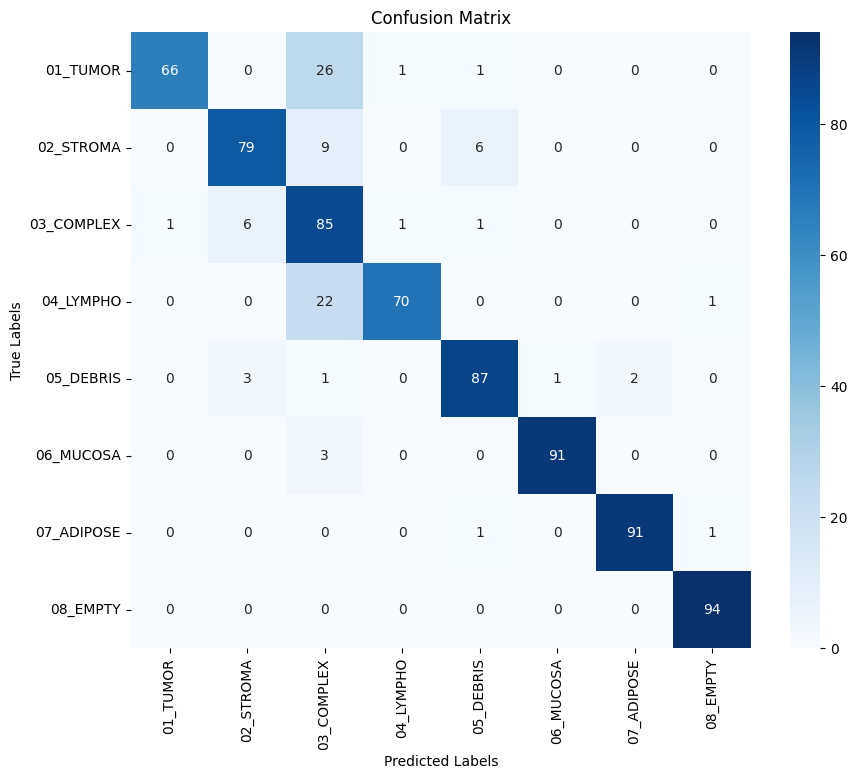

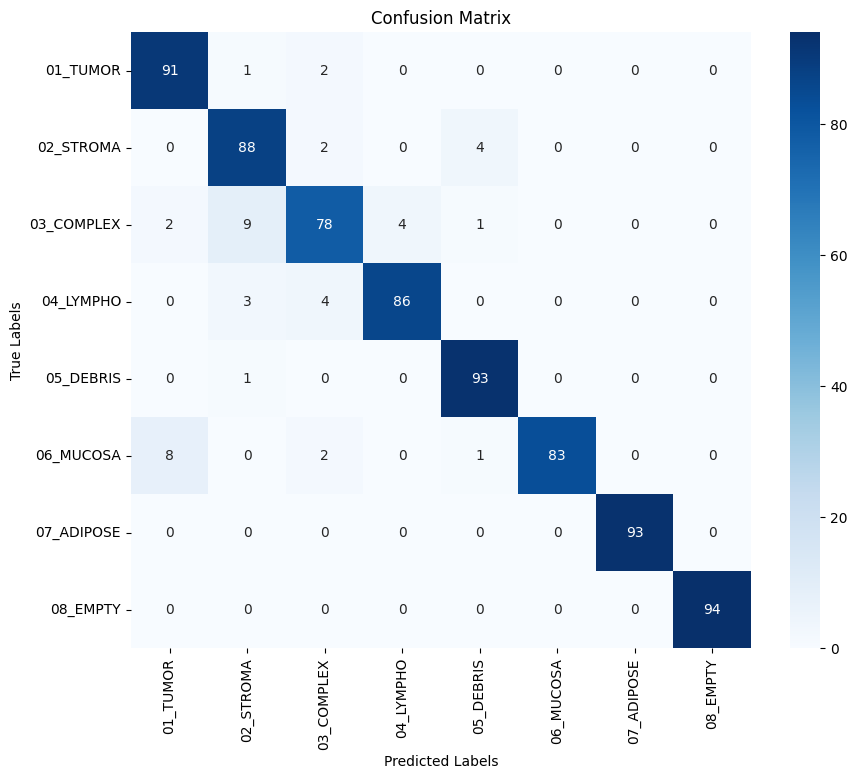

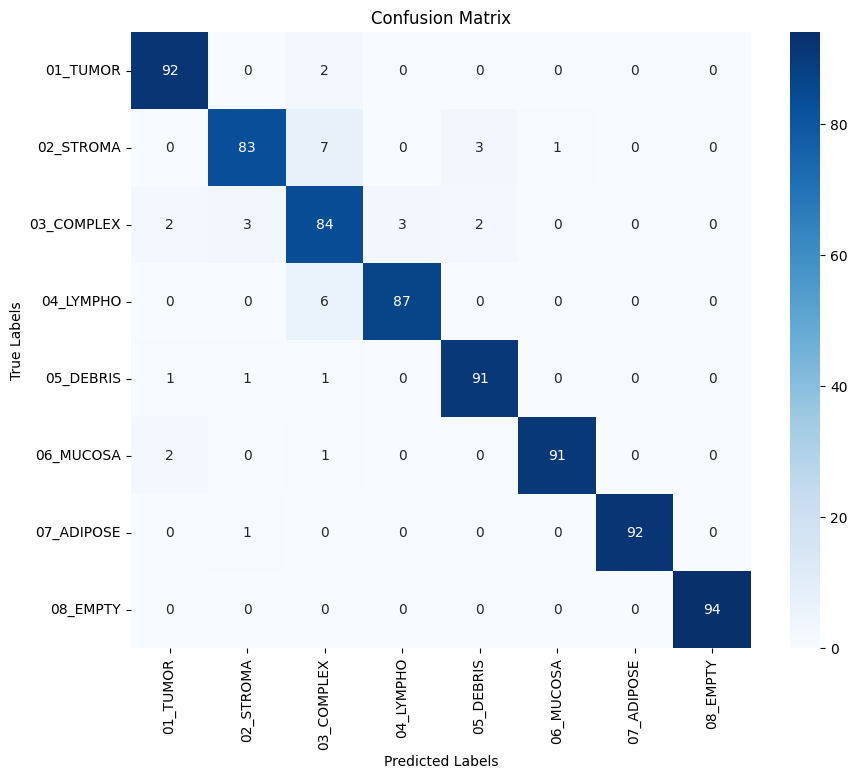

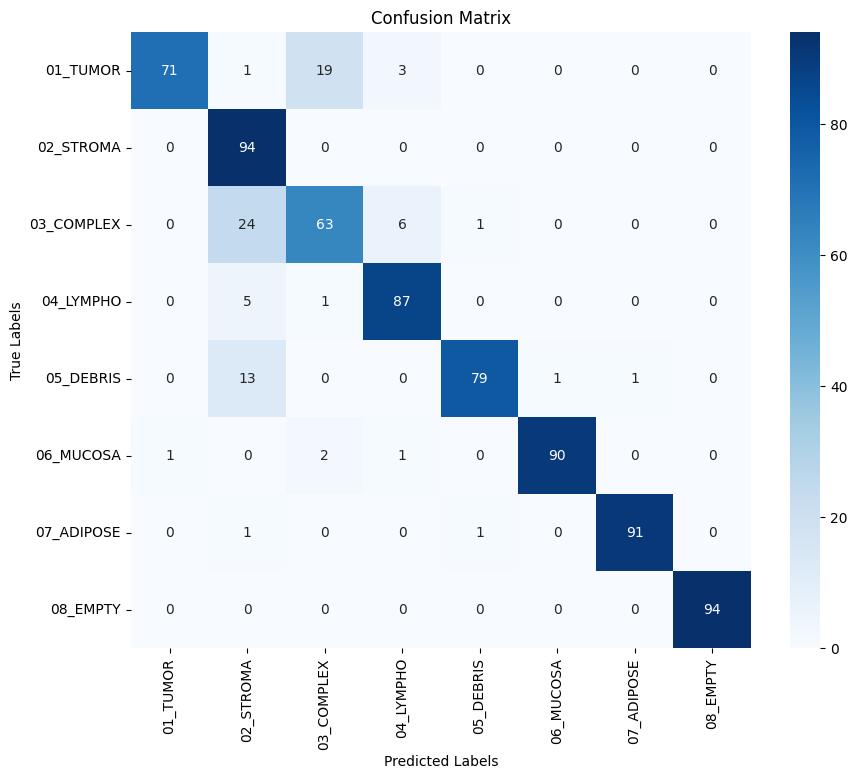

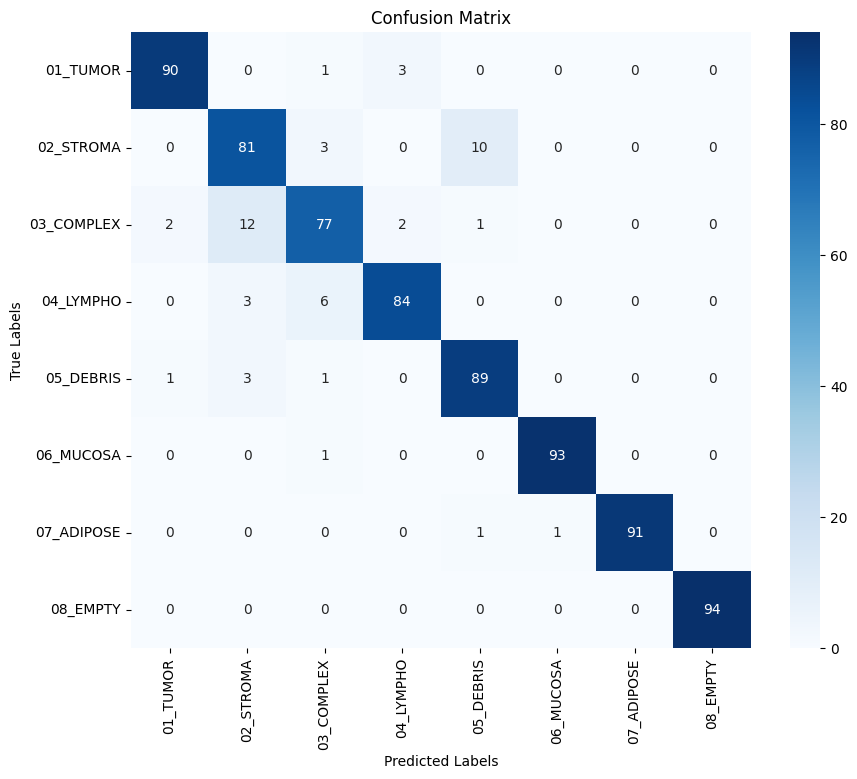

...

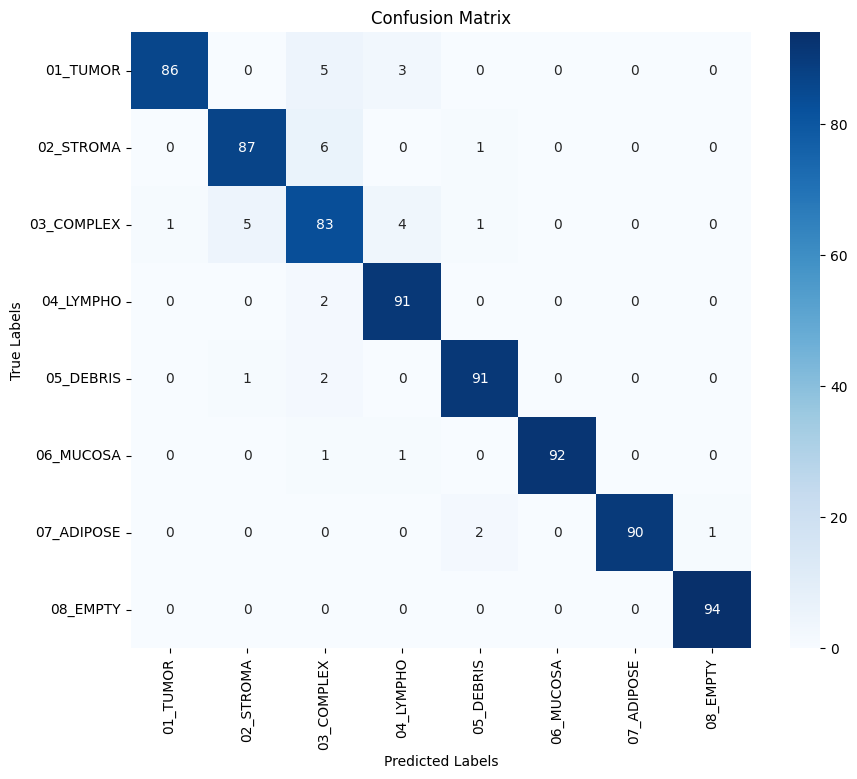

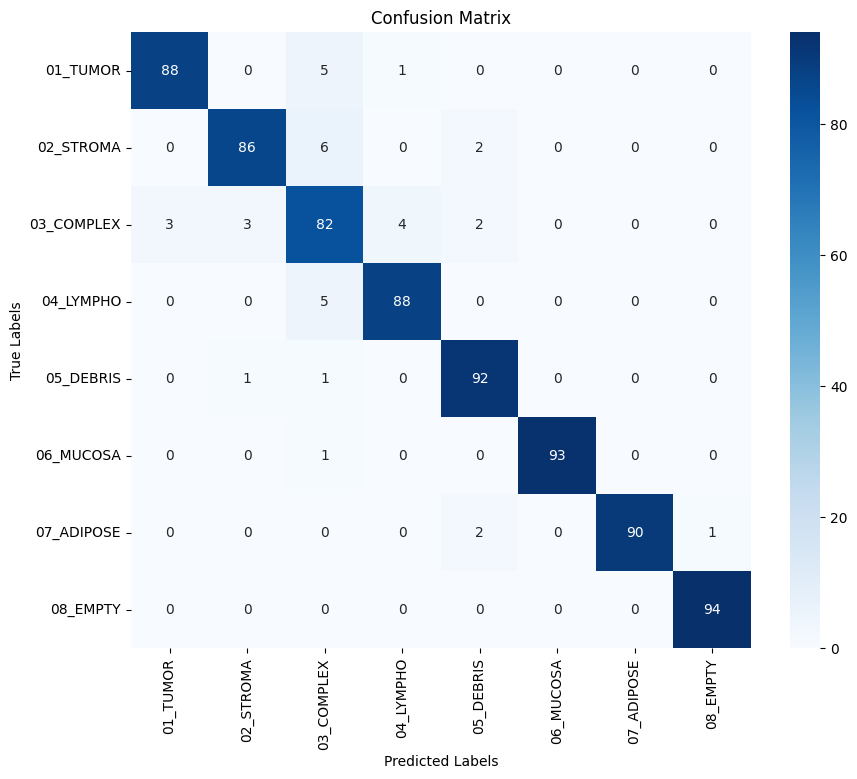

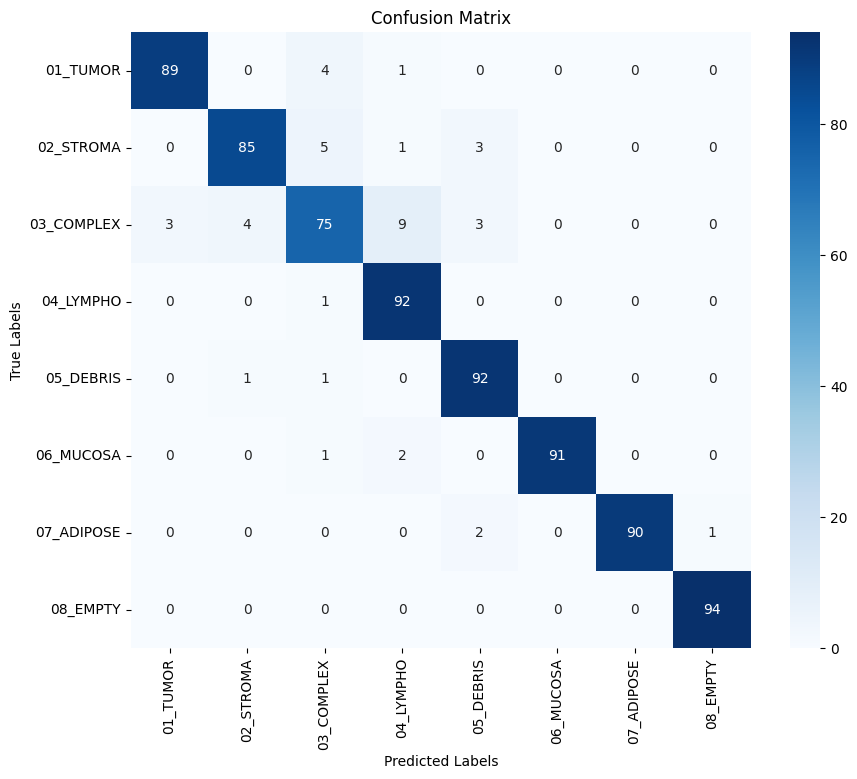

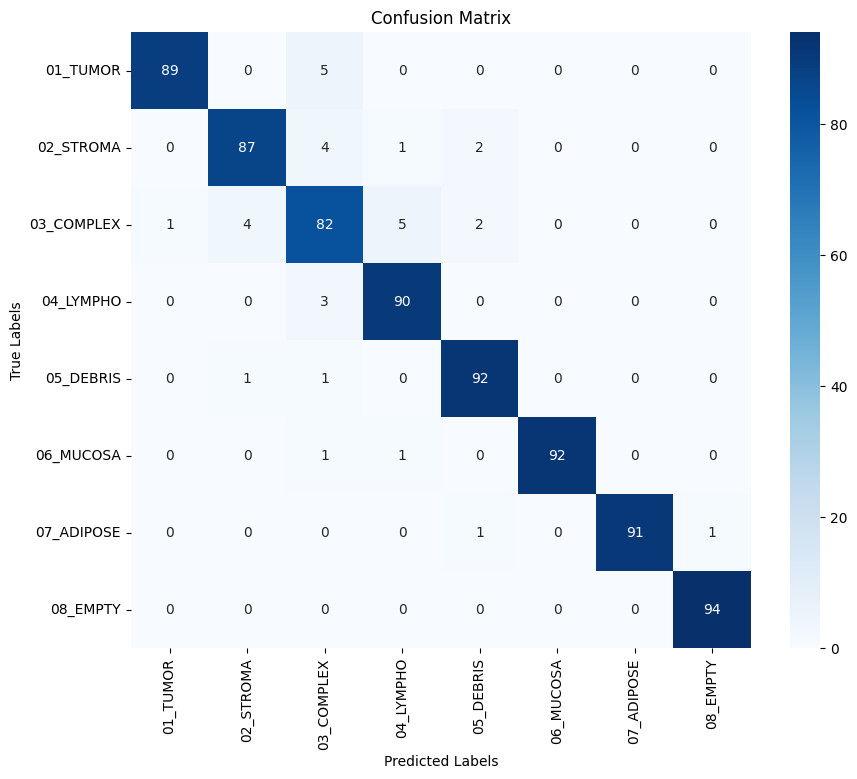

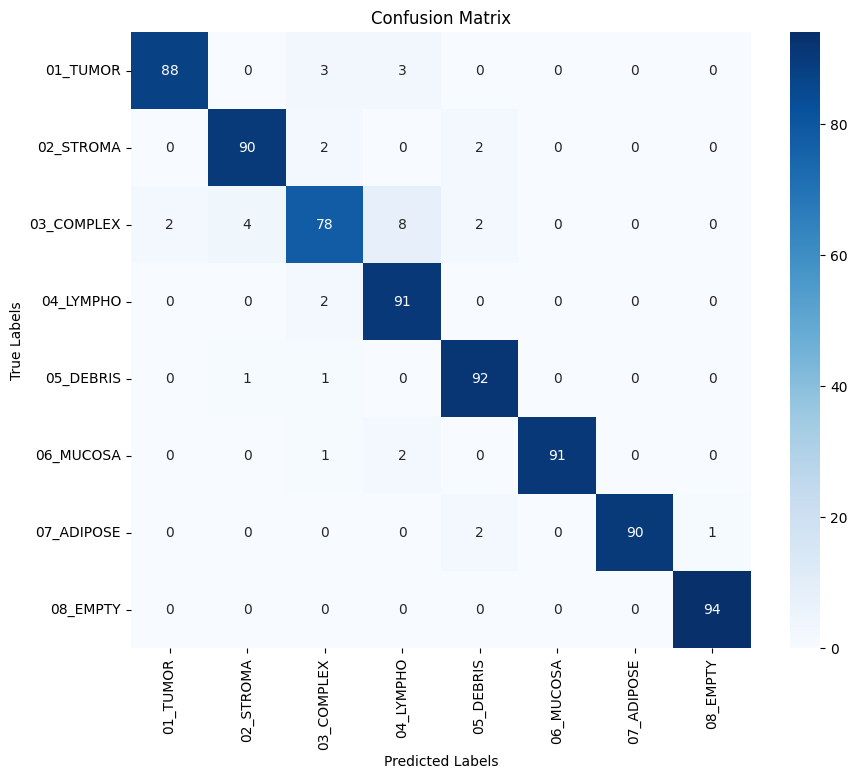

In [13]:
num_epochs = 200
learning_rate = 0.0001
embed_size = 64  # Ex
heads = 8  # Ex

model = HybridModel(num_classes=8, embed_size=embed_size, heads=heads)
train_model(model, train_loader, val_loader, num_epochs=num_epochs, learning_rate=learning_rate)

In [11]:
# Scheduler Reduce On Plateau

import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix

def train_model(model, train_loader, val_loader, num_epochs, learning_rate, save_dir='/kaggle/working'):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=10, verbose=True)
    
    history = {'train_loss': [], 'val_loss': [], 'train_accuracy': [], 'val_accuracy': []}
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        train_correct = 0
        total_train = 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            train_correct += (predicted == labels).sum().item()
            total_train += labels.size(0)
        
        train_loss /= len(train_loader)
        train_accuracy = train_correct / total_train
        
        val_loss, val_accuracy, val_metrics = evaluate_model(model, val_loader, criterion, device)
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_accuracy'].append(train_accuracy)
        history['val_accuracy'].append(val_accuracy)
        
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
              f"Train Accuracy: {train_accuracy:.4f}, Val Accuracy: {val_accuracy:.4f}")
        print(f"Validation Metrics - Precision: {val_metrics['precision']:.4f}, Recall: {val_metrics['recall']:.4f}, "
              f"F1 Score: {val_metrics['f1_score']:.4f}, Error Rate: {val_metrics['error_rate']:.4f}")
        
        # Step the scheduler
        scheduler.step(val_loss)
        
        # Save the model at each epoch
        model_save_path = f'{save_dir}/model_epoch_{epoch+1}.pth'
        torch.save(model.state_dict(), model_save_path)
        print(f"Model saved to {model_save_path}")
    
    return history


In [12]:
def evaluate_model(model, val_loader, criterion, device):
    model.eval()
    val_loss = 0.0
    val_correct = 0
    total_val = 0
    
    all_labels = []
    all_predictions = []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            
            _, predicted = torch.max(outputs, 1)
            val_correct += (predicted == labels).sum().item()
            total_val += labels.size(0)
            
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
    
    val_loss /= len(val_loader)
    val_accuracy = val_correct / total_val
    
    precision = precision_score(all_labels, all_predictions, average='macro')
    recall = recall_score(all_labels, all_predictions, average='macro')
    f1 = f1_score(all_labels, all_predictions, average='macro')
    error_rate = 1 - accuracy_score(all_labels, all_predictions)
    
    metrics = {
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'error_rate': error_rate
    }
    
    return val_loss, val_accuracy, metrics

In [13]:
num_epochs = 200
learning_rate = 0.0001
embed_size = 64  # Example value
heads = 8  # Example value

model = HybridModel(num_classes=8, embed_size=embed_size, heads=heads)
train_model(model, train_loader, val_loader, num_epochs=num_epochs, learning_rate=learning_rate)

Epoch 1/200, Train Loss: 1.1218, Val Loss: 0.3770, Train Accuracy: 0.6797, Val Accuracy: 0.8920
Validation Metrics - Precision: 0.8943, Recall: 0.8920, F1 Score: 0.8907, Error Rate: 0.1080
Model saved to /kaggle/working/model_epoch_1.pth
Epoch 2/200, Train Loss: 0.3704, Val Loss: 0.3505, Train Accuracy: 0.8968, Val Accuracy: 0.8940
Validation Metrics - Precision: 0.9060, Recall: 0.8940, F1 Score: 0.8934, Error Rate: 0.1060
Model saved to /kaggle/working/model_epoch_2.pth
Epoch 3/200, Train Loss: 0.2355, Val Loss: 0.3043, Train Accuracy: 0.9343, Val Accuracy: 0.8930
Validation Metrics - Precision: 0.9044, Recall: 0.8930, F1 Score: 0.8930, Error Rate: 0.1070
Model saved to /kaggle/working/model_epoch_3.pth
Epoch 4/200, Train Loss: 0.1655, Val Loss: 0.2977, Train Accuracy: 0.9563, Val Accuracy: 0.9140
Validation Metrics - Precision: 0.9295, Recall: 0.9140, F1 Score: 0.9137, Error Rate: 0.0860
Model saved to /kaggle/working/model_epoch_4.pth
Epoch 5/200, Train Loss: 0.1186, Val Loss: 0.266

{'train_loss': [1.1218380732536315,
  0.37041947478055953,
  0.23549839204549788,
  0.1654906832575798,
  0.1185871557444334,
  0.1117257692180574,
  0.09915959166549146,
  0.06603675922006369,
  0.048195014180615545,
  0.07107509596273304,
  0.07087684951908886,
  0.039953619642183184,
  0.0651177788269706,
  0.04935925700701773,
  0.04032618332374841,
  0.02498670530342497,
  0.02839630176220089,
  0.032895682154921814,
  0.025916408472461627,
  0.019916100282920523,
  0.008130414136685431,
  0.005830495841742959,
  0.005447006565867924,
  0.005338711895048618,
  0.0038763502545189114,
  0.005460177916858811,
  0.00503711165417917,
  0.0030227691144682468,
  0.0020574702092562803,
  0.002704762583016418,
  0.003397281592595391,
  0.003796708415145986,
  0.0013634130327845923,
  0.0013749412591278088,
  0.002418004272156395,
  0.001107340591319371,
  0.0013794639065745286,
  0.001513688350940356,
  0.0016273457759525627,
  0.0018820222096401268,
  0.0013826444167352747,
  0.0010062980

In [113]:
# Load the model from a saved file path
model_path = '/kaggle/working/model_epoch_16.pth'
num_classes = 8  # Number of classes for your classification task
embed_size = 64  # Embedding size used in SelfAttention
heads = 8  # Number of attention heads

model = HybridModel(num_classes, embed_size, heads)
model.load_state_dict(torch.load(model_path))
model.eval()  # Set the model to evaluation mode

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

HybridModel(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 

In [262]:
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    image = transform(image).unsqueeze(0)  # Add batch dimension
    return image

def check_tensor_leaf_status(tensor, name):
    print(f"{name} - Tensor is leaf: {tensor.is_leaf}, requires_grad: {tensor.requires_grad}")

In [278]:
def occlusion_sensitivity(model, image, target_class=None, occlusion_size=15, occlusion_stride=8):
    model.eval()
    device = next(model.parameters()).device
    image = image.to(device)
    
    # Detach image to make it a leaf tensor and set requires_grad
    image = image.detach().clone()
    image.requires_grad = True
    check_tensor_leaf_status(image, "Original Image")

    _, _, H, W = image.shape
    heatmap = np.zeros((H, W))

    with torch.no_grad():
        base_prediction, _ = model(image)
    if target_class is None:
        target_class = base_prediction.argmax(dim=1)

    for y in range(0, H, occlusion_stride):
        for x in range(0, W, occlusion_stride):
            occluded_image = image.clone()
            patch = torch.zeros((1, 3, min(occlusion_size, H - y), min(occlusion_size, W - x)), device=device)
            occluded_image[:, :, y:y+patch.shape[2], x:x+patch.shape[3]] = patch
            
            # Check the leaf status after occlusion
            check_tensor_leaf_status(occluded_image, "Occluded Image")

            with torch.no_grad():
                output, _ = model(occluded_image)
            score = output[0, target_class].item()  # Extracting the score value
            heatmap[y:y+patch.shape[2], x:x+patch.shape[3]] = base_prediction[0, target_class].item() - score

    heatmap = np.maximum(heatmap, 0)
    heatmap = heatmap / np.max(heatmap)

    return heatmap

In [269]:
# Debugging Step: Simple tensor operation
def debug_tensor_operation(image):
    image = image.detach().clone()
    image.requires_grad = True
    check_tensor_leaf_status(image, "Debug Image")
    return image.requires_grad

In [279]:
image_path = '/kaggle/input/kather/Kather_texture_2016_image_tiles_5000/02_STROMA/1000D_CRC-Prim-HE-01_028.tif_Row_451_Col_151.tif'  # Replace with your image path
image_tensor = load_image(image_path)

In [271]:
# Debug tensor operation
print("Debug Tensor Operation: ", debug_tensor_operation(image_tensor))

Debug Image - Tensor is leaf: True, requires_grad: True
Debug Tensor Operation:  True


Original Image - Tensor is leaf: True, requires_grad: True


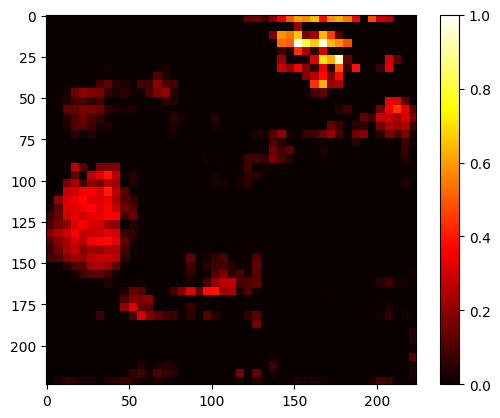

In [283]:
# GA OVERLAY
# Perform occlusion sensitivity
heatmap = occlusion_sensitivity(model, image_tensor, target_class=None, occlusion_size=25, occlusion_stride=5)
# Visualize the result
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

Original Image - Tensor is leaf: True, requires_grad: True


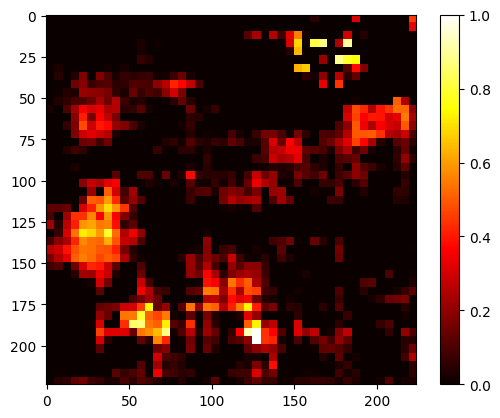

In [282]:
image_path = '/kaggle/input/kather/Kather_texture_2016_image_tiles_5000/01_TUMOR/10009_CRC-Prim-HE-03_009.tif_Row_301_Col_151.tif'  # Replace with your image path
image_tensor = load_image(image_path)
heatmap = occlusion_sensitivity(model, image_tensor, target_class=None, occlusion_size=25, occlusion_stride=5)
# Visualize the result
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

Original Image - Tensor is leaf: True, requires_grad: True


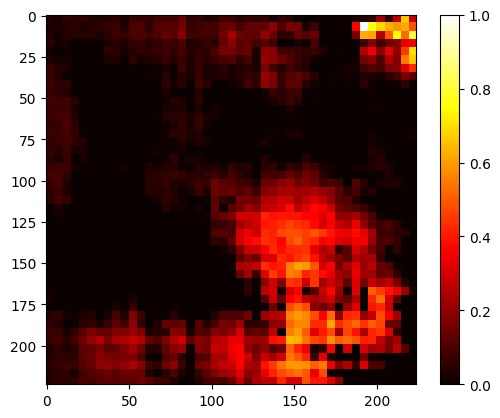

In [284]:
image_path = '/kaggle/input/kather/Kather_texture_2016_image_tiles_5000/02_STROMA/1000D_CRC-Prim-HE-01_028.tif_Row_451_Col_151.tif'  # Replace with your image path
image_tensor = load_image(image_path)
heatmap = occlusion_sensitivity(model, image_tensor, target_class=None, occlusion_size=25, occlusion_stride=5)
# Visualize the result
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

Original Image - Tensor is leaf: True, requires_grad: True


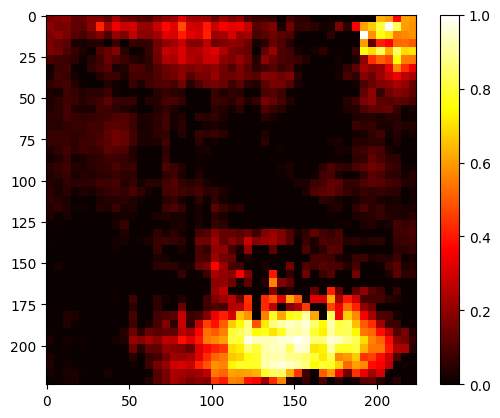

In [285]:
image_path = '/kaggle/input/kather/Kather_texture_2016_image_tiles_5000/03_COMPLEX/10011_CRC-Prim-HE-03_002.tif_Row_451_Col_901.tif'  # Replace with your image path
image_tensor = load_image(image_path)
heatmap = occlusion_sensitivity(model, image_tensor, target_class=None, occlusion_size=25, occlusion_stride=5)
# Visualize the result
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

Original Image - Tensor is leaf: True, requires_grad: True


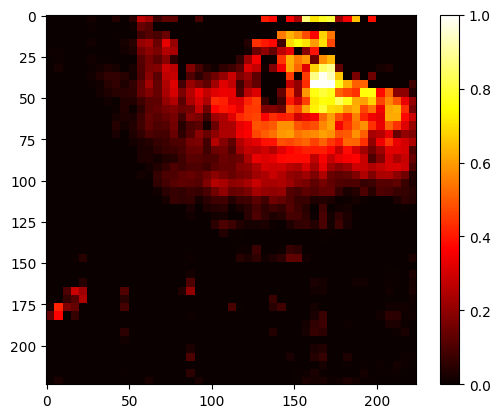

In [286]:
image_path = '/kaggle/input/kather/Kather_texture_2016_image_tiles_5000/04_LYMPHO/1017A_CRC-Prim-HE-05_022.tif_Row_301_Col_1.tif'  # Replace with your image path
image_tensor = load_image(image_path)
heatmap = occlusion_sensitivity(model, image_tensor, target_class=None, occlusion_size=25, occlusion_stride=5)
# Visualize the result
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

Original Image - Tensor is leaf: True, requires_grad: True


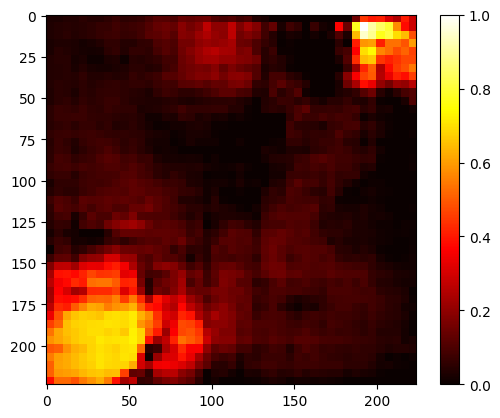

In [287]:
image_path = '/kaggle/input/kather/Kather_texture_2016_image_tiles_5000/05_DEBRIS/1001C_CRC-Prim-HE-04_012.tif_Row_1_Col_151.tif'  # Replace with your image path
image_tensor = load_image(image_path)
heatmap = occlusion_sensitivity(model, image_tensor, target_class=None, occlusion_size=25, occlusion_stride=5)
# Visualize the result
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

Original Image - Tensor is leaf: True, requires_grad: True


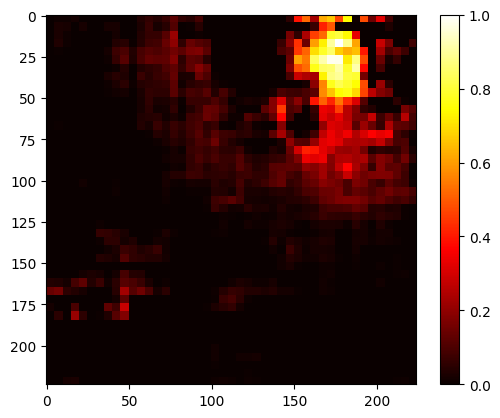

In [288]:
image_path = '/kaggle/input/kather/Kather_texture_2016_image_tiles_5000/06_MUCOSA/10088_CRC-Prim-HE-08_022.tif_Row_751_Col_151.tif'  # Replace with your image path
image_tensor = load_image(image_path)
heatmap = occlusion_sensitivity(model, image_tensor, target_class=None, occlusion_size=25, occlusion_stride=5)
# Visualize the result
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

Original Image - Tensor is leaf: True, requires_grad: True


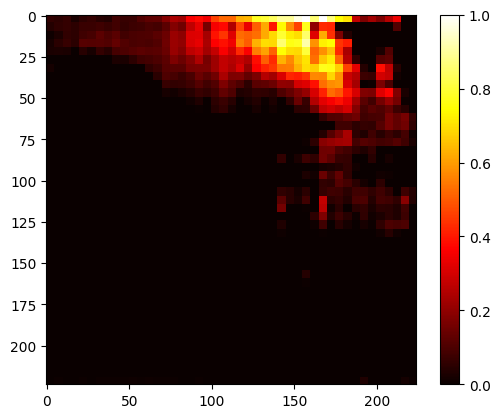

In [289]:
image_path = '/kaggle/input/kather/Kather_texture_2016_image_tiles_5000/07_ADIPOSE/10006_CRC-Prim-HE-03_012.tif_Row_601_Col_2251.tif'  # Replace with your image path
image_tensor = load_image(image_path)
heatmap = occlusion_sensitivity(model, image_tensor, target_class=None, occlusion_size=25, occlusion_stride=5)
# Visualize the result
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

Original Image - Tensor is leaf: True, requires_grad: True


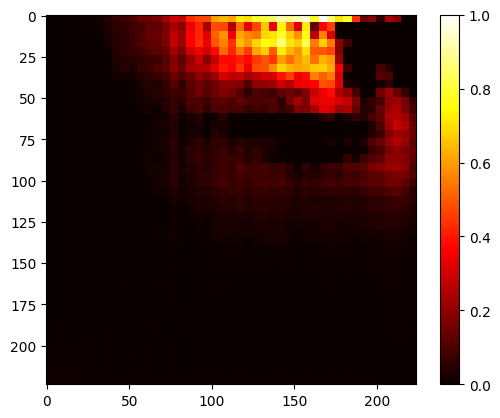

In [290]:
image_path = '/kaggle/input/kather/Kather_texture_2016_image_tiles_5000/08_EMPTY/10015_CRC-Prim-HE-06_005.tif_Row_4651_Col_1501.tif'  # Replace with your image path
image_tensor = load_image(image_path)
heatmap = occlusion_sensitivity(model, image_tensor, target_class=None, occlusion_size=25, occlusion_stride=5)
# Visualize the result
plt.imshow(heatmap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

In [ ]:
# OVERLAY

occlusion_result = occlusion_sensitivity(model, image_tensor)

plt.imshow(occlusion_result)
plt.axis('off')
plt.show()

In [259]:
def check_tensor_leaf_status(tensor, name="Image"):
    print(f"{name} is leaf: {tensor.is_leaf}, requires_grad: {tensor.requires_grad}")

In [260]:
def occlusion_sensitivity(model, image, target_class=None, occlusion_size=15, occlusion_stride=8):
    model.eval()
    device = next(model.parameters()).device
    image = image.to(device)
    
    # Detach image to make it a leaf tensor and set requires_grad
    image = image.detach().clone()
    image.requires_grad = True
    
    check_tensor_leaf_status(image)

    _, _, H, W = image.shape
    heatmap = np.zeros((H, W))
    patch = torch.zeros((1, 3, occlusion_size, occlusion_size), device=device)

    with torch.no_grad():
        output = model(image)
        output = output[0]  # Extracting the output tensor
        if target_class is None:
            target_class = output.argmax().item() # Changed here
    
    for y in range(0, H, occlusion_stride):
        for x in range(0, W, occlusion_stride):
            occluded_image = image.clone()
            occluded_image[:, :, y:min(y+occlusion_size, H), x:min(x+occlusion_size, W)] = patch[:, :, :min(occlusion_size, H - y), :min(occlusion_size, W - x)]
            
            # Check the leaf status after occlusion
            check_tensor_leaf_status(occluded_image, "Occluded Image")

            with torch.no_grad():
                output = model(occluded_image)
                output = output[0]  # Extracting the output tensor
            score = output[0, target_class].item() # Changed here
            heatmap[y:y+occlusion_size, x:x+occlusion_size] = output[0, target_class].item() - score # Changed here

    heatmap = np.maximum(heatmap, 0)
    heatmap = heatmap / np.max(heatmap)

    # Overlay heatmap on the original image
    heatmap = cv2.resize(heatmap, (image.shape[3], image.shape[2]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    occlusion_overlay = heatmap * 0.4 + image.detach().cpu().numpy().squeeze().transpose(1, 2, 0) * 0.6
    occlusion_overlay = np.clip(occlusion_overlay, 0, 1)

    return occlusion_overlay